In [1]:
from pyspark.sql import SparkSession
import pyspark.sql.functions as F
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StandardScaler
from pyspark.ml.feature import PCA
from pyspark.ml import Pipeline
from pyspark.ml.clustering import KMeans
import numpy as np
from pyspark.ml.functions import vector_to_array
from scipy.spatial.distance import euclidean
from pyspark.sql.types import FloatType, IntegerType
import spotipy
from spotipy.oauth2 import SpotifyOAuth, SpotifyClientCredentials
import matplotlib.pyplot as plt
from skimage import io

In [2]:
spark = SparkSession.builder\
    .appName("recomendacao")\
    .master("spark://spark-master:7077")\
    .getOrCreate()

spark.sparkContext.setLogLevel("OFF")

spark

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/09/13 14:22:45 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
dados_musicas = spark.read.csv("s3a://bronze/recomendacao/alura/dados_musicas", sep=";", header=True, inferSchema=True)
dados_musicas.show(5, truncate=False)

+------------------+----+------------+------------+------------+-----------+------------------+--------+----------------------+----------------+---+--------+-------------------+----+-------------------+----------+-----------+-------+----------------------------+
|valence           |year|acousticness|artists     |danceability|duration_ms|energy            |explicit|id                    |instrumentalness|key|liveness|loudness           |mode|name               |popularity|speechiness|tempo  |artists_song                |
+------------------+----+------------+------------+------------+-----------+------------------+--------+----------------------+----------------+---+--------+-------------------+----+-------------------+----------+-----------+-------+----------------------------+
|0.285             |2000|0.00239     |Coldplay    |0.429       |266773     |0.6609999999999999|0       |3AJwUDP919kvQ9QcozQPxg|1.21E-4         |11 |0.234   |-7.227             |1   |Yellow             |84       

In [4]:
dados_musicas_api = spark.read.parquet("s3a://silver/recomendacao/kaggle_spotify",inferSchema=True)

In [5]:
dados_musicas.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: integer (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- artists: string (nullable = true)
 |-- danceability: double (nullable = true)
 |-- duration_ms: integer (nullable = true)
 |-- energy: double (nullable = true)
 |-- explicit: integer (nullable = true)
 |-- id: string (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- key: integer (nullable = true)
 |-- liveness: double (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: integer (nullable = true)
 |-- name: string (nullable = true)
 |-- popularity: integer (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- artists_song: string (nullable = true)



In [6]:
dados_anos = spark.read.csv("s3a://bronze/recomendacao/alura/dados_anos", header=True, inferSchema=True)
dados_anos.show(5)

+----+----+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+-------------------+------------------+-------------------+-------------------+---+
|mode|year|      acousticness|      danceability|       duration_ms|             energy|   instrumentalness|          liveness|           loudness|        speechiness|             tempo|            valence|         popularity|key|
+----+----+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+-------------------+------------------+-------------------+-------------------+---+
|   1|1921|0.8868960000000005|0.4185973333333336|260537.16666666663|0.23181513333333334|0.34487805886666656|           0.20571| -17.04866666666665|           0.073662|101.53149333333329|0.37932666666666665| 0.6533333333333333|  2|
|   1|1922|0.9385915492957748|0.4820422535211267|165469.74647887325|0.237815

In [7]:
dados_anos.printSchema()

root
 |-- mode: integer (nullable = true)
 |-- year: integer (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- danceability: double (nullable = true)
 |-- duration_ms: double (nullable = true)
 |-- energy: double (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- liveness: double (nullable = true)
 |-- loudness: double (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- valence: double (nullable = true)
 |-- popularity: double (nullable = true)
 |-- key: integer (nullable = true)



In [8]:
dados_anos = dados_anos.filter(dados_anos.year >= 2000)

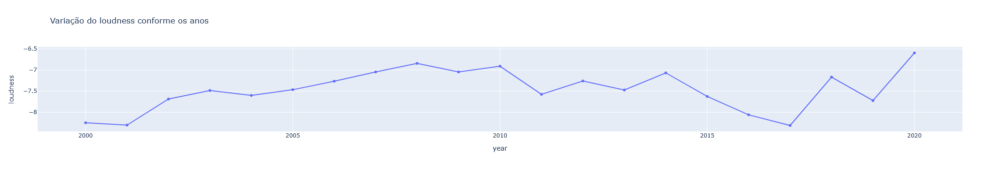

In [9]:
import plotly.express as px

fig = px.line(dados_anos.toPandas(), x='year', y='loudness', markers=True, title='Variação do loudness conforme os anos')
fig.show()

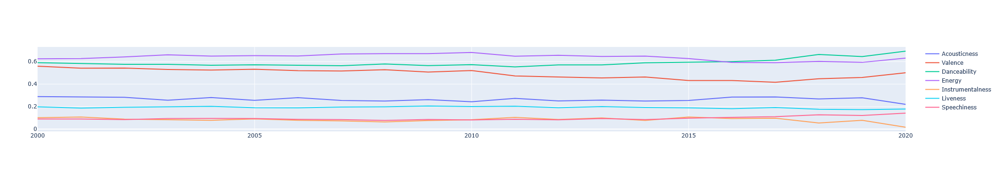

In [10]:
import plotly.graph_objects as go

fig = go.Figure()

temp = dados_anos.toPandas()

fig.add_trace(go.Scatter(x=temp['year'], y=temp['acousticness'], name='Acousticness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['valence'],
                    name='Valence'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['danceability'],
                    name='Danceability'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['energy'],
                    name='Energy'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['instrumentalness'],
                    name='Instrumentalness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['liveness'],
                    name='Liveness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['speechiness'],
                    name='Speechiness'))

fig.show()


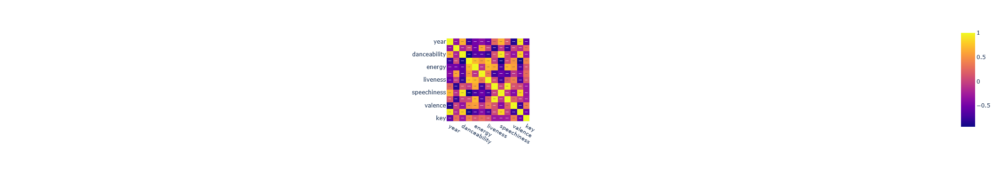

In [11]:
fig = px.imshow(dados_anos.drop('mode').toPandas().corr(), text_auto=True)
fig.show()


In [12]:
dados_generos = spark.read.csv("s3a://bronze/recomendacao/alura/dados_generos", header=True, inferSchema=True)
dados_generos.show(5)

+----+--------------------+------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+-------------------+------------------+-------------------+------------------+---+
|mode|              genres|      acousticness|       danceability|       duration_ms|             energy|    instrumentalness|           liveness|           loudness|        speechiness|             tempo|            valence|        popularity|key|
+----+--------------------+------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+-------------------+------------------+-------------------+------------------+---+
|   1|21st century clas...|0.9793333333333332|0.16288333333333335|160297.66666666663|0.07131666666666665|          0.60683367|             0.3616|-31.514333333333337|0.04056666666666667|           75.3365|0.10378333333333334| 27.83333333333333|  6|
|   

In [13]:
x = dados_generos.columns
x.remove('genres')
dados_generos_vector = VectorAssembler(inputCols=x, outputCol='features').transform(dados_generos).select(['features', 'genres'])
dados_generos_vector.show(truncate=False, n=5)

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------------------+
|features                                                                                                                                                                                                                   |genres                |
+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+----------------------+
|[1.0,0.9793333333333332,0.16288333333333335,160297.66666666663,0.07131666666666665,0.60683367,0.3616,-31.514333333333337,0.04056666666666667,75.3365,0.10378333333333334,27.83333333333333,6.0]                            |21st century classical|
|[1.0,0.49478,0.2993

In [14]:
scaler = StandardScaler(inputCol='features', outputCol='scaled_features')
scaler_model = scaler.fit(dados_generos_vector)
dados_generos_scaler = scaler_model.transform(dados_generos_vector)

In [15]:
pca = PCA(k=2, inputCol='scaled_features', outputCol='pca_features')
model_pca = pca.fit(dados_generos_scaler)
dados_generos_pca = model_pca.transform(dados_generos_scaler)

In [16]:
dados_generos_pca.select('pca_features').show(5,truncate=False)

+-----------------------------------------+
|pca_features                             |
+-----------------------------------------+
|[2.507095366888567,0.43816913737697955]  |
|[-0.5969679056633486,4.981612052751347]  |
|[-4.158460276223561,-0.8366525081079937] |
|[-2.387344878512217,-0.4877989015663406] |
|[-2.6501218371679083,-0.5756819768820469]|
+-----------------------------------------+
only showing top 5 rows



In [17]:
pca_pipeline = Pipeline(stages=[VectorAssembler(inputCols=x, outputCol='features'),
                                StandardScaler(inputCol='features', outputCol='scaled_features'),
                                PCA(k=2, inputCol='scaled_features', outputCol='pca_features')])

In [18]:
pca_pipeline_model = pca_pipeline.fit(dados_generos)
dados_generos_pca = pca_pipeline_model.transform(dados_generos)

In [19]:
dados_generos_pca.select('pca_features').show(truncate=False)

+------------------------------------------+
|pca_features                              |
+------------------------------------------+
|[2.507095366888567,0.43816913737697955]   |
|[-0.5969679056633486,4.981612052751347]   |
|[-4.158460276223561,-0.8366525081079937]  |
|[-2.387344878512217,-0.4877989015663406]  |
|[-2.6501218371679083,-0.5756819768820469] |
|[-1.4965091203367624,1.8644183183717793]  |
|[-3.9235207721573238,0.2851835002352834]  |
|[-4.611011109831115,-0.6783790472312372]  |
|[-2.8376900630842297,-0.5712993716580518] |
|[-2.706690139892783,-1.2593788079708297]  |
|[-4.698331383924287,1.276556968061945]    |
|[-3.3759874966798677,0.756074106430747]   |
|[-5.608998877066021,1.0427311644393216]   |
|[0.29549463521176883,-0.27638645862363015]|
|[-2.5725591062870423,-1.3169815431109795] |
|[-3.400822802049345,0.5073029625781902]   |
|[-4.366720316263418,-0.33648270597710866] |
|[-2.7254698167724003,0.5058604987046368]  |
|[-4.958112358381606,1.2627579957290729]   |
|[-3.69349

In [20]:
SEED = 1224

kmeans = KMeans(featuresCol='pca_features', predictionCol='cluster_pca').setK(5).setSeed(SEED)
model_kmeans = kmeans.fit(dados_generos_pca)
prections_kmeans = model_kmeans.transform(dados_generos_pca)
prections_kmeans.select('pca_features', 'cluster_pca').show(truncate=False)

+------------------------------------------+-----------+
|pca_features                              |cluster_pca|
+------------------------------------------+-----------+
|[2.507095366888567,0.43816913737697955]   |2          |
|[-0.5969679056633486,4.981612052751347]   |2          |
|[-4.158460276223561,-0.8366525081079937]  |4          |
|[-2.387344878512217,-0.4877989015663406]  |0          |
|[-2.6501218371679083,-0.5756819768820469] |0          |
|[-1.4965091203367624,1.8644183183717793]  |2          |
|[-3.9235207721573238,0.2851835002352834]  |4          |
|[-4.611011109831115,-0.6783790472312372]  |1          |
|[-2.8376900630842297,-0.5712993716580518] |4          |
|[-2.706690139892783,-1.2593788079708297]  |0          |
|[-4.698331383924287,1.276556968061945]    |3          |
|[-3.3759874966798677,0.756074106430747]   |4          |
|[-5.608998877066021,1.0427311644393216]   |1          |
|[0.29549463521176883,-0.27638645862363015]|2          |
|[-2.5725591062870423,-1.316981

In [21]:
prections_kmeans.withColumn('x', vector_to_array('pca_features')[0])\
                .withColumn('y', vector_to_array('pca_features')[1])\
                .select(['x', 'y', 'cluster_pca', 'genres'])

DataFrame[x: double, y: double, cluster_pca: int, genres: string]

In [22]:
pca_features_xy = prections_kmeans.withColumn('x', vector_to_array('pca_features')[0])\
                .withColumn('y', vector_to_array('pca_features')[1])\
                .select(['x', 'y', 'cluster_pca', 'genres'])

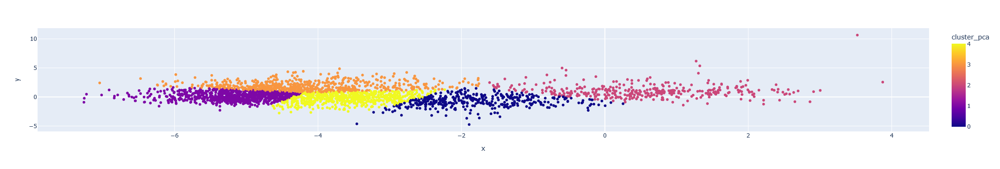

In [23]:
fig = px.scatter(pca_features_xy.toPandas(), x='x', y='y', color='cluster_pca', hover_data=['x', 'y', 'genres'])
fig.show()

In [24]:
pca_pipeline_model.stages
pca_pipeline_model.stages[2]
pca_pipeline_model.stages[2].explainedVariance


DenseVector([0.2975, 0.1212])

# Aplicando ao df de musicas

In [25]:
dados_musicas_api = dados_musicas_api.withColumn(
    "explicit",
    F.when(F.col("explicit") == True, 1).otherwise(0)
)

dados_musicas_api.select([F.count(F.when(F.isnull(c), 1)).alias(c) for c in dados_musicas_api.columns]).show()

apimusicas_filled = dados_musicas_api.fillna(0)

apimusicas_filled.select([F.count(F.when(F.isnull(c), 1)).alias(c) for c in dados_musicas_api.columns]).show()

+---+-------+------------+-------+------------+-----------+------+--------+----------------+---+--------+--------+----+----+----------+-----------+-----+------------+----+
| id|valence|acousticness|artists|danceability|duration_ms|energy|explicit|instrumentalness|key|liveness|loudness|mode|name|popularity|speechiness|tempo|artists_song|year|
+---+-------+------------+-------+------------+-----------+------+--------+----------------+---+--------+--------+----+----+----------+-----------+-----+------------+----+
|  0|      2|           3|      1|          94|         35|    32|       0|               0|  7|       1|       5|   6|   1|       120|          4|    0|           0|   0|
+---+-------+------------+-------+------------+-----------+------+--------+----------------+---+--------+--------+----+----+----------+-----------+-----+------------+----+

+---+-------+------------+-------+------------+-----------+------+--------+----------------+---+--------+--------+----+----+----------+----

In [26]:
X = dados_musicas.columns
X.remove('artists')
X.remove('id')
X.remove('name')
X.remove('artists_song')

dados_encoded_vector = VectorAssembler(inputCols=X, outputCol='features').transform(apimusicas_filled)

In [27]:
scaler = StandardScaler(inputCol='features', outputCol='features_scaled')
model_scaler = scaler.fit(dados_encoded_vector)
dados_musicas_scaler = model_scaler.transform(dados_encoded_vector)

k = len(X)
pca = PCA(k=k, inputCol='features_scaled', outputCol='pca_features')
model_pca = pca.fit(dados_musicas_scaler)
dados_musicas_pca = model_pca.transform(dados_musicas_scaler)

sum(model_pca.explainedVariance) * 100

lista_valores = [sum(model_pca.explainedVariance[0:i+1]) for i in range(k)]
k = sum(np.array(lista_valores) <= 0.7)
print(k)

9


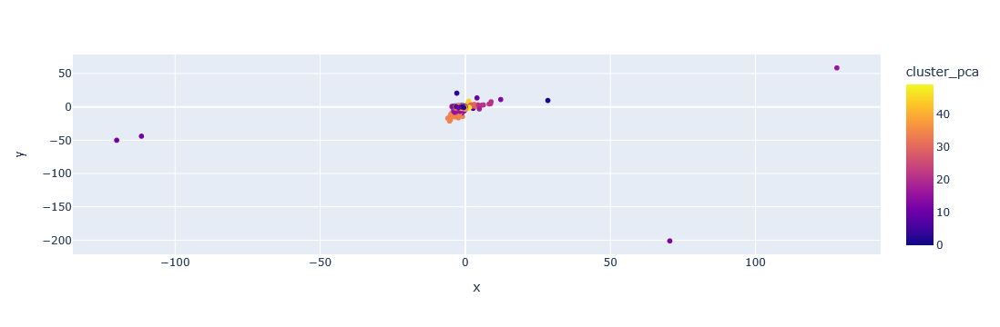

In [41]:
pca_pipeline = Pipeline(stages=[VectorAssembler(inputCols=X, outputCol='features'),
                                StandardScaler(inputCol='features', outputCol='features_scaled'),
                                PCA(k=9, inputCol='features_scaled', outputCol='pca_features')])

model_pca_pipeline = pca_pipeline.fit(apimusicas_filled)
projection = model_pca_pipeline.transform(apimusicas_filled)

kmeans = KMeans(k=50, featuresCol='pca_features', predictionCol='cluster_pca', seed=SEED)
modelo_kmeans = kmeans.fit(projection)
projetion_kmeans = modelo_kmeans.transform(projection) 
projetion_kmeans = projetion_kmeans.withColumn('x', vector_to_array('pca_features')[0])\
                                   .withColumn('y', vector_to_array('pca_features')[1])

fig = px.scatter(projetion_kmeans.toPandas(), x='x', y='y', color='cluster_pca', hover_data=['artists_song'])
fig.show()

In [43]:
nome_musica = 'Linkin Park - In the End'
cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome_musica).select('cluster_pca').collect()[0][0]
print(cluster)

musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                       .select('artists_song', 'id', 'pca_features')

componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]

33


In [32]:
def recomendador(nome_musica):
  cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome_musica).select('cluster_pca').collect()[0][0]
  musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                       .select('artists_song', 'id', 'pca_features')
  componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]

  def calcula_distance(value):
    return euclidean(componenetes_musica, value)

  udf_calcula_distance = F.udf(calcula_distance, FloatType())

  musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distance('pca_features'))

  recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10)).select(['artists_song', 'id', 'Dist'])

  recomendadas.select('artists_song').show(truncate=False)

In [33]:
recomendador('Linkin Park - In the End')

+----------------------------------------------------+
|artists_song                                        |
+----------------------------------------------------+
|Linkin Park - In the End                            |
|Bad Bunny;Rauw Alejandro - Party                    |
|The Chainsmokers;Coldplay - Something Just Like This|
|Bruno Mars - Just the Way You Are                   |
|Sean Paul;Dua Lipa - No Lie                         |
|AC/DC - Highway to Hell                             |
|Luke Combs - The Kind of Love We Make               |
|Drake;Wizkid;Kyla - One Dance                       |
|Adele - Set Fire to the Rain                        |
|Grouplove - Tongue Tied                             |
+----------------------------------------------------+



In [34]:
client_id = 'a9c86f501b7649b9a08b579e0f981604'
client_secret = '31274311b80b44768ee04e3473eb7246'

In [35]:
scope = "user-library-read playlist-modify-private"

OAuth = SpotifyOAuth(
        scope=scope,         
        redirect_uri='http://localhost:5000/callback',
        client_id = client_id,
        client_secret = client_secret)

client_credentials_manager = SpotifyClientCredentials(client_id = client_id,
                                                      client_secret = client_secret)

sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

In [36]:
def recomendador_api(nome_musica):
  cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome_musica).select('cluster_pca').collect()[0][0]
  musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                       .select('artists_song', 'id', 'pca_features')
  componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]

  def calcula_distance(value):
    return euclidean(componenetes_musica, value)

  udf_calcula_distance = F.udf(calcula_distance, FloatType())

  musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distance('pca_features'))

  recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10)).select(['artists_song', 'id', 'Dist'])

  recomendadas.select('artists_song').show(truncate=False)

    #API
  playlist_ids = [row['id'] for row in recomendadas.select('id').collect()]

  playlist_api = []
  tracks_api = sp.tracks(playlist_ids)
  return tracks_api

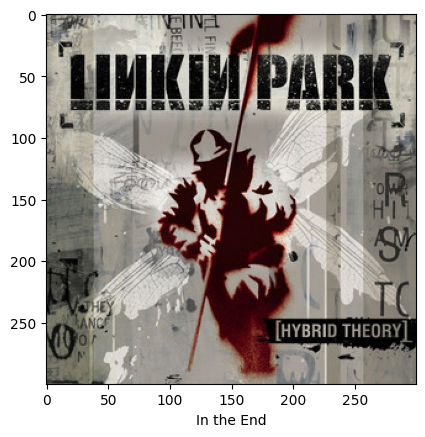

In [37]:
nome_musica = 'Linkin Park - In the End'

id = projetion_kmeans\
          .filter(projetion_kmeans.artists_song == nome_musica)\
          .select('id').collect()[0][0]

track = sp.track(id)

url = track["album"]["images"][1]["url"]
name = track["name"]

image = io.imread(url)
plt.imshow(image)
plt.xlabel(name, fontsize = 10)
plt.show()


In [38]:
def visualize_songs(name,url):

    plt.figure(figsize=(15,10))
    columns = 5
    for i, u in enumerate(url):
        ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
        image = io.imread(u)
        plt.imshow(image)
        ax.get_yaxis().set_visible(False)
        plt.xticks(color = 'w', fontsize = 0.1)
        plt.yticks(color = 'w', fontsize = 0.1)
        plt.xlabel(names[i].replace(" - ", "\n"), fontsize=9)
        plt.tight_layout(h_pad=0.7, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.grid(visible=None)
        #plt.axis('off')
    plt.show()

In [39]:
def recomendador_api_w_image(nome_musica):
    cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome_musica).select('cluster_pca').collect()[0][0]
    musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                       .select('artists_song', 'id', 'pca_features')
    componenetes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                          .select('pca_features').collect()[0][0]

    def calcula_distance(value):
        return euclidean(componenetes_musica, value)

    udf_calcula_distance = F.udf(calcula_distance, FloatType())

    musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distance('pca_features'))

    recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10)).select(['artists_song', 'id', 'Dist'])

    #API
    playlist_ids = [row['id'] for row in recomendadas.select('id').collect()]
    tracks_api = sp.tracks(playlist_ids) 

    result = []
    
    for track in tracks_api['tracks']:
        track_name = track['name']
        artist_name = track['artists'][0]['name'] 
        album_images = track['album']['images']
        album_name = track['album']['name']
        image_url = album_images[0]['url'] if album_images else None
        result.append({'track_name': f"{track_name} - {artist_name} - {album_name}" , 'album_image_url': image_url})

    return result


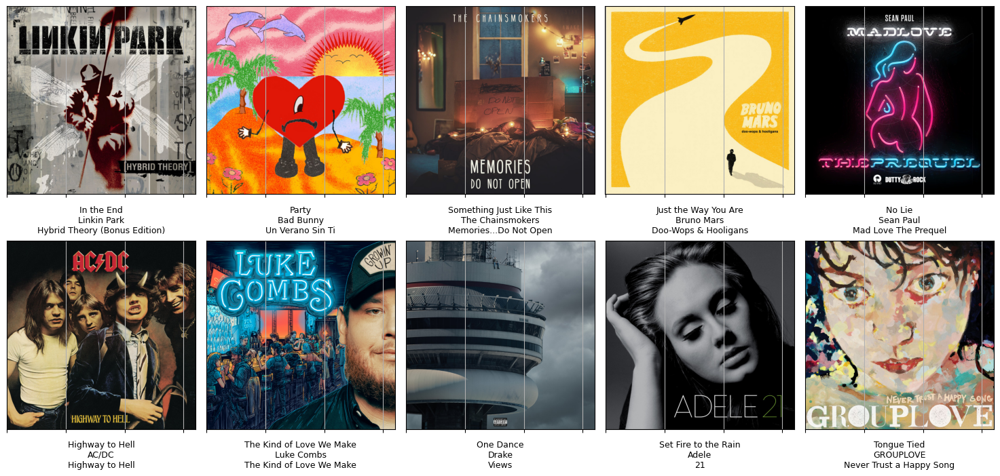

In [40]:
recs = recomendador_api_w_image('Linkin Park - In the End')
names = [r['track_name'] for r in recs]
urls = [r['album_image_url'] for r in recs]
visualize_songs(names, urls)